# Guided-based Data Generation

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import cv2

In [2]:
from rasterization_q10.generator_dev import NusLoaderQ10

DATAROOT='/datasets/nuscene/v1.0-mini'

sampling_time = 3
agent_time = 0 # zero for static mask, non-zero for overlap

layer_names = ['drivable_area', 'road_segment', 'road_block',
               'lane', 'ped_crossing', 'walkway', 'stop_line',
               'carpark_area', 'road_divider', 'lane_divider']
colors = [(255, 255, 255), (100, 255, 255), (255, 100, 255),
          (255, 255, 100), (100, 100, 255), (100, 255, 100), (255, 100, 100),
          (100, 100, 100), (50, 100, 50), (200, 50, 50),]

dataset = NusLoaderQ10(
    root=DATAROOT, 
    sampling_time=sampling_time, 
    agent_time=agent_time, 
    layer_names=layer_names, 
    colors=colors,
    resolution=0.1,
    meters_ahead=25,
    meters_behind=25,
    meters_left=25,
    meters_right=25)

print("num_samples: {}".format(len(dataset)))

Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 0.374 seconds.
Reverse indexing ...
Done reverse indexing in 0.1 seconds.
num_samples: 404


In [3]:
dataset.thres_min = -1
dataset.thres_max = 99999

map_masks, map_img, agent_mask, xy_local, \
virtual_mask, virtual_xy_local, idx = dataset[190] # 100th sample

agent_past = xy_local[0]
agent_future = xy_local[1]
agent_translation = xy_local[2]

virtual_past = virtual_xy_local[0]
virtual_future = virtual_xy_local[1]
virtual_translation = virtual_xy_local[2]

print(map_masks.shape)
print(agent_mask.shape)
print(virtual_mask.shape)

print(len(agent_past))
print(len(virtual_past))

(11, 500, 500, 3)
(500, 500, 3)
(500, 500, 3)
10
28


/home/q10/.pyenv/versions/intelpro/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


In [4]:
def load_data(idx, thres_min, thres_max):
    global dataset, map_masks, map_img, agent_mask, xy_local,\
    virtual_mask, virtual_xy_local,\
    agent_past, agent_future, agent_translation,\
    virtual_past, virtual_future, virtual_translation
    
    dataset.thres_min = thres_min
    dataset.thres_max = thres_max
    
    map_masks, map_img, agent_mask, xy_local, \
    virtual_mask, virtual_xy_local, idx = dataset[idx]
    
    agent_past = xy_local[0]
    agent_future = xy_local[1]
    agent_translation = xy_local[2] 
    virtual_past = virtual_xy_local[0]
    virtual_future = virtual_xy_local[1]
    virtual_translation = virtual_xy_local[2]

In [5]:
def draw_paths(ax, local_paths):
    past = local_paths[0]
    future = local_paths[1]
    for i in range(len(past)):
        if len(past[i]) != 0:
            ax.plot(past[i][-6:, 0], past[i][-6:, 1], 
                    color='salmon', linewidth=6, alpha=0.5)
        if len(future[i]) != 0:
            ax.plot(future[i][:6, 0], future[i][:6, 1], 
                    color='steelblue', linewidth=6, alpha=0.5)

## parsed data

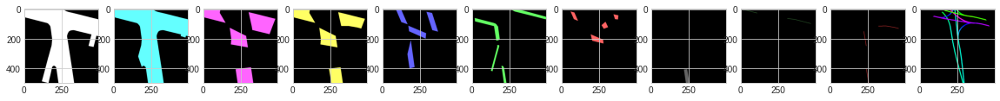

In [6]:
N = map_masks.shape[0]
fig, ax = plt.subplots(1,N, figsize=(20,5))
for i in range(N):
    ax[i].imshow(map_masks[i])
plt.show()

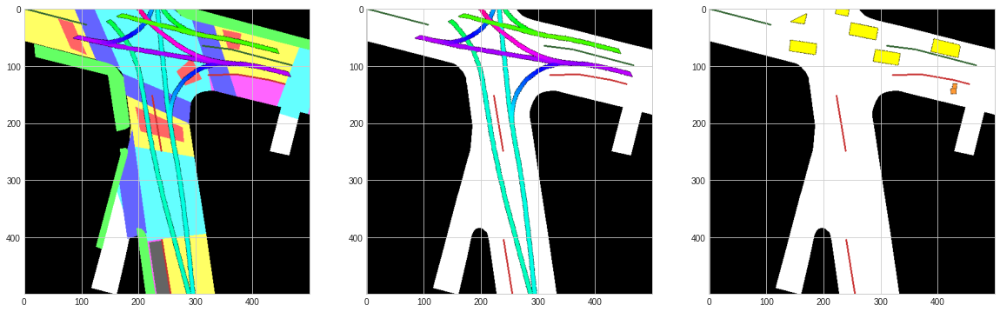

In [7]:
from nuscenes.prediction.input_representation.combinators import Rasterizer
combinator = Rasterizer()

map_combined = combinator.combine(map_masks[[0,8,9,-1]])
agents_combined = combinator.combine(
    np.append(map_masks[[0,8,9]], agent_mask[np.newaxis,...], axis=0))

fig, ax = plt.subplots(1,3, figsize=(20,7))
ax[0].imshow(map_img)
ax[1].imshow(map_combined)
ax[2].imshow(agents_combined)
plt.show()

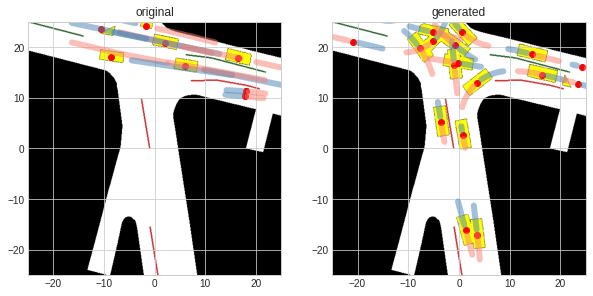

In [8]:
agents_combined = combinator.combine(
    np.append(map_masks[[0,8,9]], agent_mask[np.newaxis,...], axis=0))
virtual_agents_combined = combinator.combine(
    np.append(map_masks[[0,8,9]], virtual_mask[np.newaxis,...], axis=0))

fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].set_title("original")
ax[0].imshow(agents_combined, extent=[-25,25,-25,25])
draw_paths(ax[0], xy_local)
ax[0].scatter(agent_translation[:,0], agent_translation[:,1], c='r')
ax[0].set_xlim(-25, 25)
ax[0].set_ylim(-25, 25)

ax[1].set_title("generated")
ax[1].imshow(virtual_agents_combined, extent=[-25,25,-25,25])
draw_paths(ax[1], virtual_xy_local)
ax[1].scatter(virtual_translation[:,0], virtual_translation[:,1], c='r')
ax[1].set_xlim(-25, 25)
ax[1].set_ylim(-25, 25)

plt.show()

In [20]:
def show_samples():
    agents_combined = combinator.combine(
        np.append(map_masks[[0,5,8,9]], agent_mask[np.newaxis,...], axis=0))
    virtual_agents_combined = combinator.combine(
        np.append(map_masks[[0,5,8,9]], virtual_mask[np.newaxis,...], axis=0))

    fig, ax = plt.subplots(1,2, figsize=(10,5))

    ax[0].set_title("original")
    ax[0].imshow(agents_combined, extent=[-25,25,-25,25])
    if len(xy_local[0]) != 0:
        draw_paths(ax[0], xy_local)
        ax[0].scatter(agent_translation[:,0], agent_translation[:,1], c='r')
    ax[0].set_xlim(-25, 25)
    ax[0].set_ylim(-25, 25)

    ax[1].set_title("generated")
    ax[1].imshow(virtual_agents_combined, extent=[-25,25,-25,25])
    if len(virtual_xy_local[0]) != 0:
        draw_paths(ax[1], virtual_xy_local)
        ax[1].scatter(virtual_translation[:,0], virtual_translation[:,1], c='r')
    ax[1].set_xlim(-25, 25)
    ax[1].set_ylim(-25, 25)

    plt.show()

/home/q10/.pyenv/versions/intelpro/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


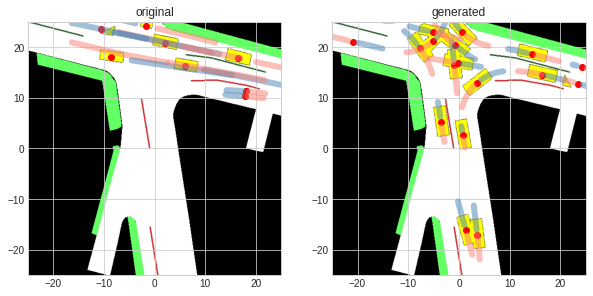

In [21]:
load_data(190, -1, 99999)
show_samples()

/home/q10/.pyenv/versions/intelpro/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


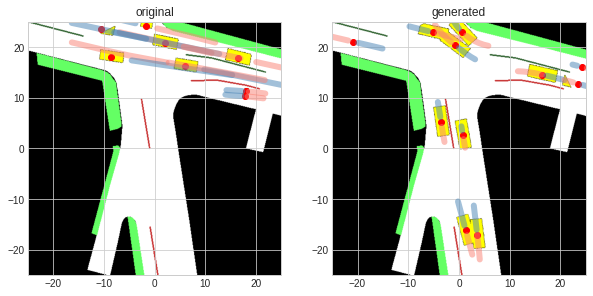

In [22]:
load_data(190, -1, 0.1)
show_samples()

/home/q10/.pyenv/versions/intelpro/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


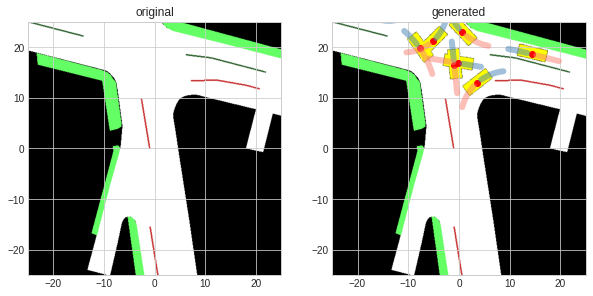

In [23]:
load_data(190, 0.02, 99999)
show_samples()

/home/q10/.pyenv/versions/intelpro/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


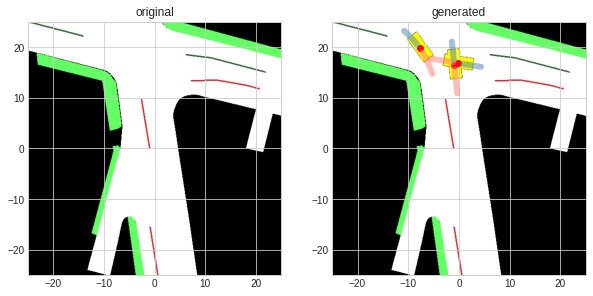

In [24]:
load_data(190, 0.4, 99999)
show_samples()

/home/q10/.pyenv/versions/intelpro/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


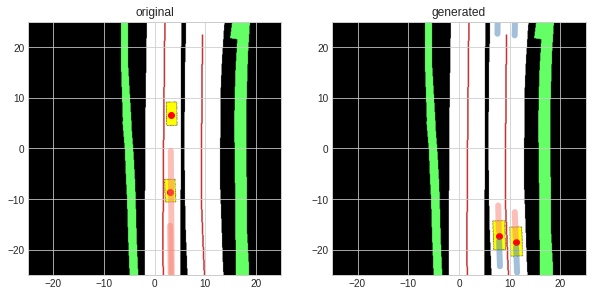

In [25]:
load_data(240, -1, 99999)
show_samples()

/home/q10/.pyenv/versions/intelpro/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


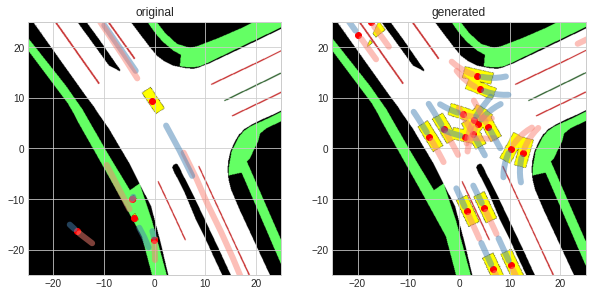

In [26]:
load_data(400, -1, 99999)
show_samples()

/home/q10/.pyenv/versions/intelpro/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


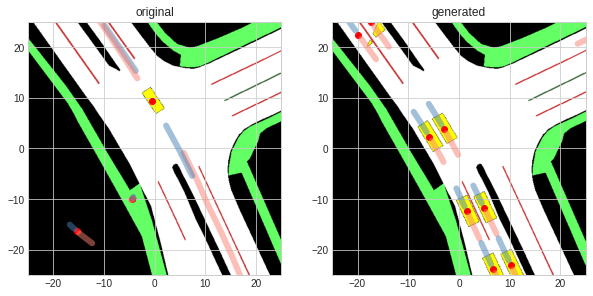

In [27]:
load_data(400, -1, 0.02)
show_samples()

/home/q10/.pyenv/versions/intelpro/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


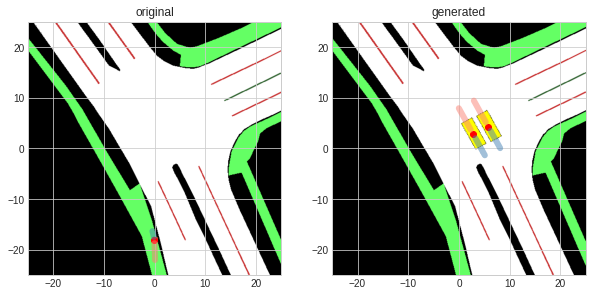

In [28]:
load_data(400, 0.1, 99999)
show_samples()

/home/q10/.pyenv/versions/intelpro/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


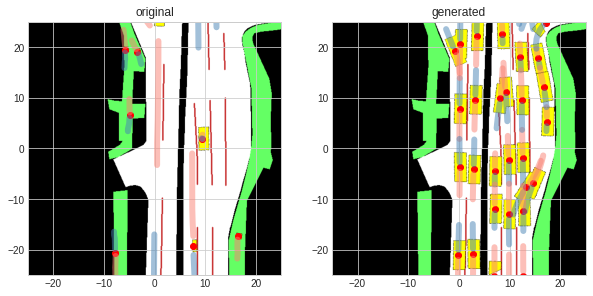

In [30]:
load_data(350, -1, 99999)
show_samples()

/home/q10/.pyenv/versions/intelpro/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


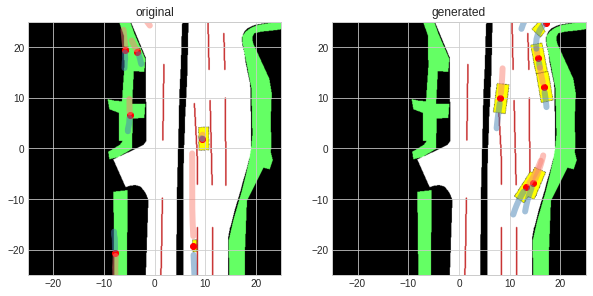

In [32]:
load_data(350, 0.01, 99999)
show_samples()

/home/q10/.pyenv/versions/intelpro/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


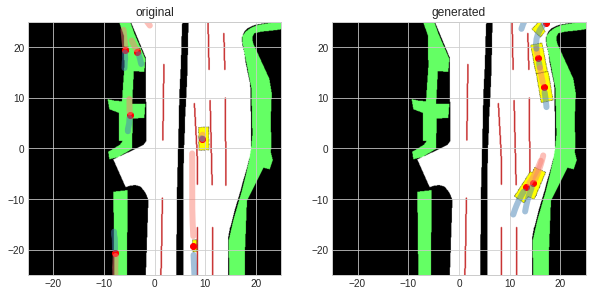

In [31]:
load_data(350, 0.02, 99999)
show_samples()

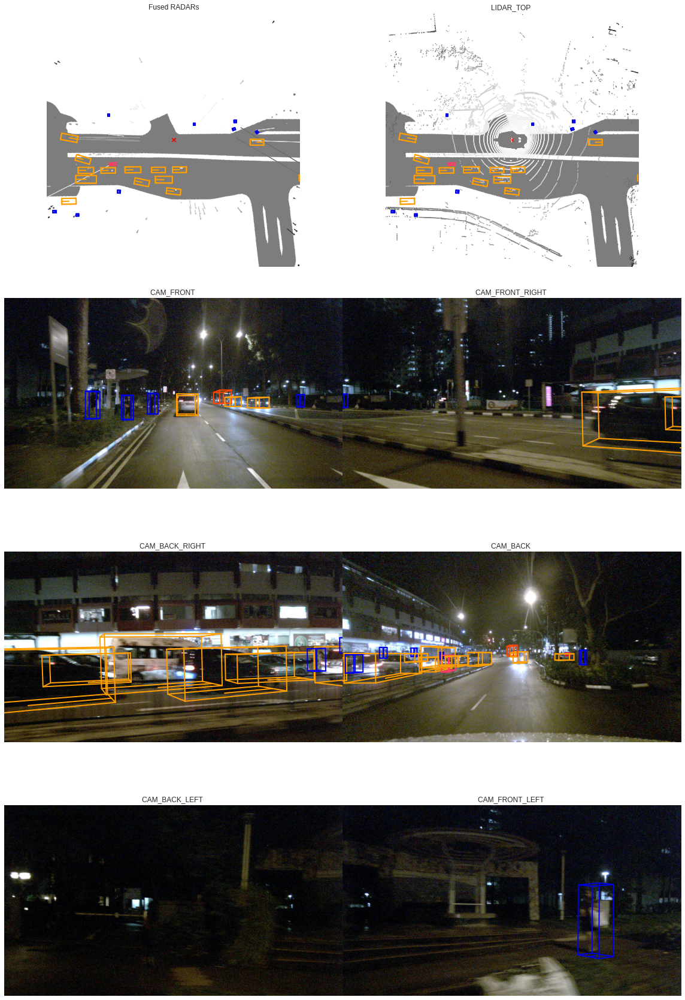

In [34]:
dataset.render_sample(350)

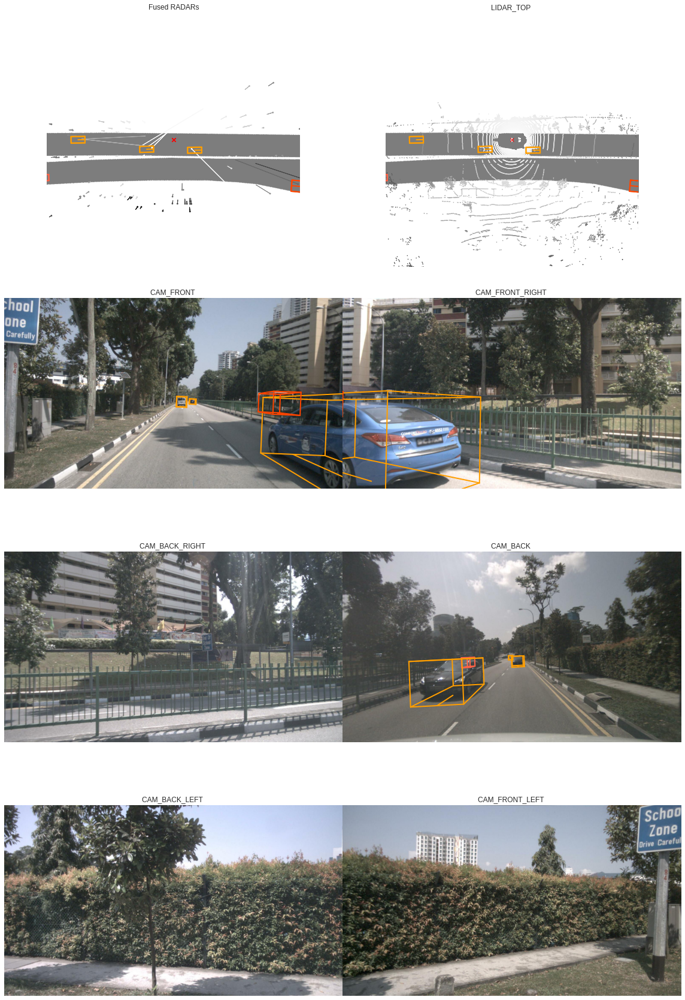

In [35]:
dataset.render_sample(240)

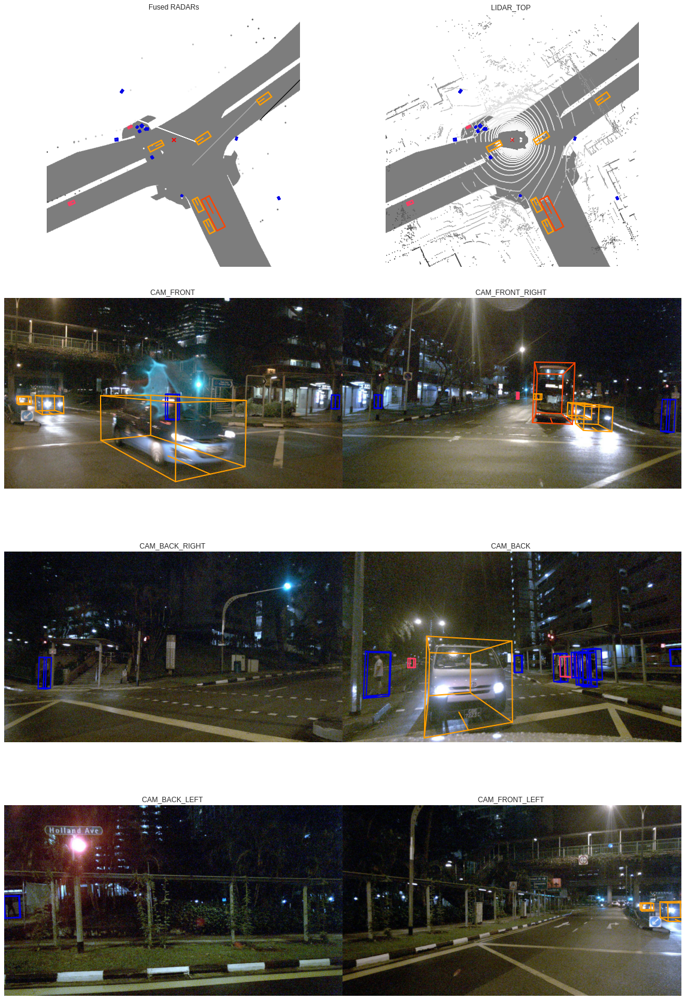

In [36]:
dataset.render_sample(400)

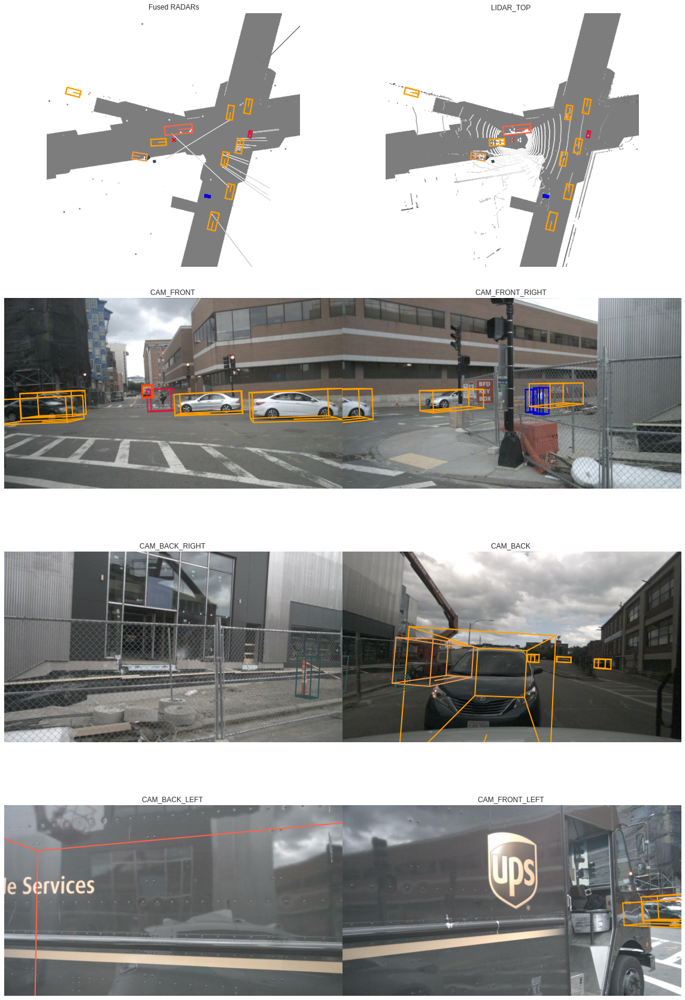

In [37]:
dataset.render_sample(190)

# Nuscene parser for trajectory prediction

In [1]:
from rasterization_q10.generator import NusLoaderQ10

DATAROOT='/datasets/nuscene/v1.0-mini'

sampling_time = 3
agent_time = 0 # zero for static mask, non-zero for overlap

layer_names = ['drivable_area', 'road_segment', 'road_block',
               'lane', 'ped_crossing', 'walkway', 'stop_line',
               'carpark_area', 'road_divider', 'lane_divider']
colors = [(255, 255, 255), (255, 255, 255), (255, 255, 255),
          (255, 255, 255), (255, 255, 255), (255, 255, 255), (255, 255, 255),
          (255, 255, 255), (255, 255, 255), (255, 255, 255),]

dataset = NusLoaderQ10(
    root=DATAROOT, sampling_time=sampling_time, 
    agent_time=agent_time, layer_names=layer_names)

Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 0.322 seconds.
Reverse indexing ...
Done reverse indexing in 0.1 seconds.


In [2]:
print("num_samples: {}".format(len(dataset)))

num_samples: 404


In [3]:
map_masks, agent_masks, agents, idx = dataset[100] # 100th sample
print(map_masks.shape)
print(agent_masks.shape)
print(len(agents))
print(agents[0].keys())

(10, 800, 800)
(500, 500, 3)
51
dict_keys(['present_pos', 'past_pos', 'future_pos', 'rot', 'vel', 'accel', 'yaw_rate', 'present_local_xy', 'past_local_xy', 'future_local_xy', 'curvature'])


# Usage

In [4]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

In [5]:
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

batch_size = 32

dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# for batch_idx, samples in enumerate(dataloader):
#     print(batch_idx)
    
#     '''
#     do something
    
#     '''
#     pass

## 1. map_masks

In [6]:
print(map_masks.shape)

(10, 800, 800)


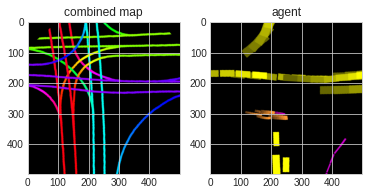

In [7]:
dataset.render_map(idx, combined=True)

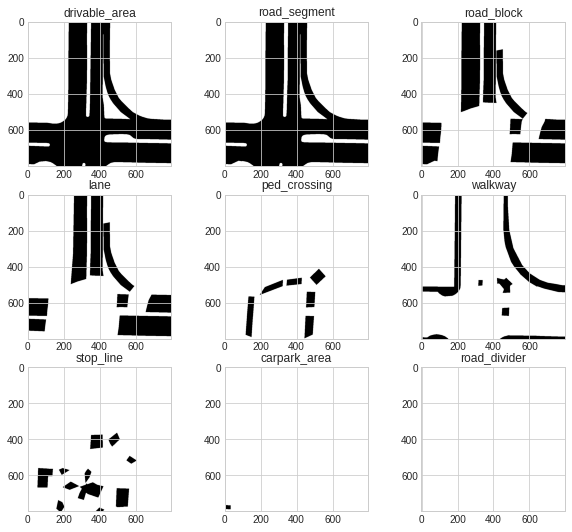

In [8]:
dataset.render_map(idx, combined=False)

## 2. agent_masks

In [9]:
print(agent_masks.shape)

(500, 500, 3)


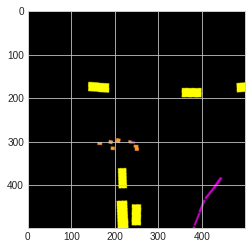

In [10]:
plt.imshow(agent_masks)
plt.show()

## 3. agent states

__1. Trajectory__  
    - present, past, future  
    - global & local  
    - curvature (for diverse sampling)  
__2. States__  
    - rot, vel, accel, yaw_rate  

In [11]:
print(len(agents))
print(agents[0].keys())

51
dict_keys(['present_pos', 'past_pos', 'future_pos', 'rot', 'vel', 'accel', 'yaw_rate', 'present_local_xy', 'past_local_xy', 'future_local_xy', 'curvature'])


In [12]:
agents[0]

{'present_pos': [1303.702, 1038.36, 0.775],
 'past_pos': array([[1303.118, 1037.841],
        [1302.534, 1037.321],
        [1301.964, 1036.88 ],
        [1301.393, 1036.439],
        [1300.823, 1035.999],
        [1300.241, 1035.575]]),
 'future_pos': array([[1304.286, 1038.88 ],
        [1304.87 , 1039.4  ],
        [1305.454, 1039.92 ],
        [1305.861, 1040.444],
        [1306.312, 1041.027],
        [1306.763, 1041.609]]),
 'rot': [0.924033835235088, 0.0, 0.0, 0.3823107000081665],
 'vel': 1.5647049469509007,
 'accel': 0.0007583506154782024,
 'yaw_rate': 0.006983004434575569,
 'present_local_xy': array([[-8.60534425,  9.31069525]]),
 'past_local_xy': array([[ -9.38132702,   9.40162233],
        [-10.15805656,   9.49188433],
        [-10.86648059,   9.62423382],
        [-11.57556972,   9.75733008],
        [-12.28324699,   9.89034467],
        [-12.98695715,  10.04296186]]),
 'future_local_xy': array([[-7.82861471,  9.22043326],
        [-7.05188517,  9.13017127],
        [-6.275

## Visualization

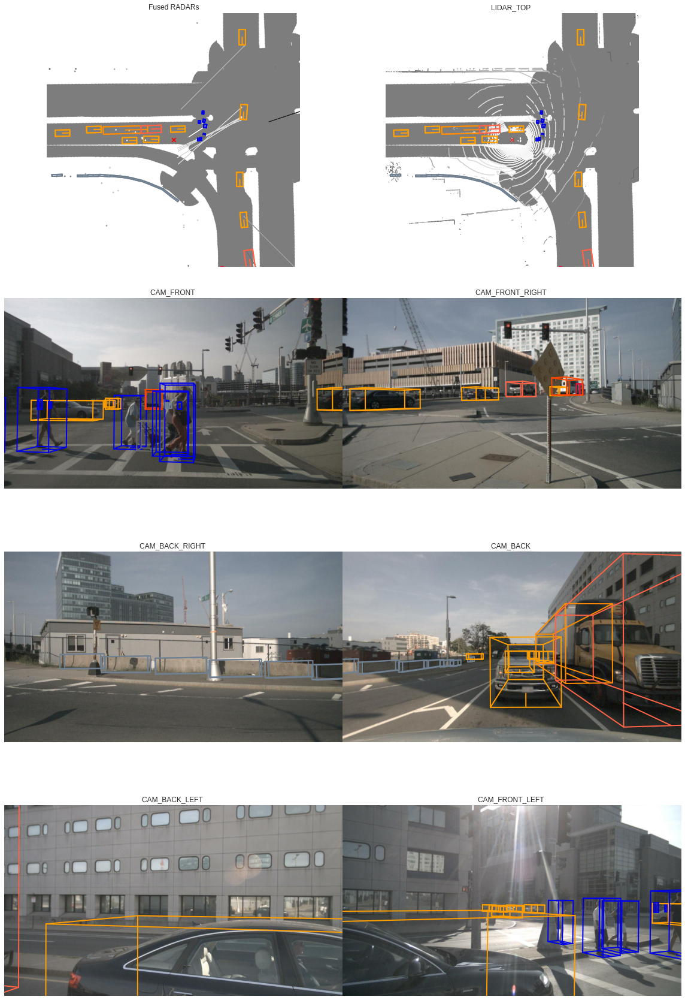

In [13]:
dataset.render_sample(idx)

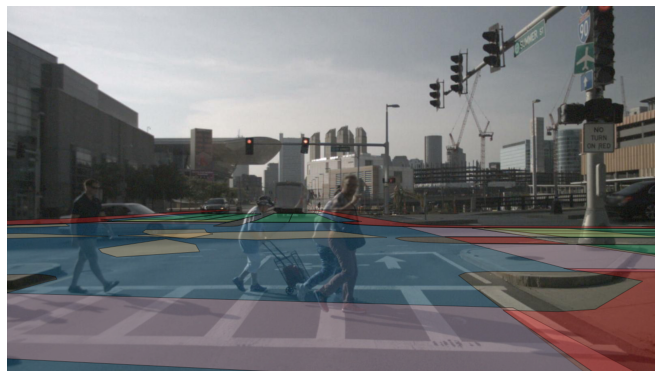

In [14]:
dataset.render_scene(idx)